# Chapter 10: Fine-Tuning Pretrained Models for Computer Vision

In [ ]:
!pip install transformers evaluate

In [ ]:
!wget https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/helper_functions.py

In [3]:
from helper_functions import get_image_from_url, save_images

## 10.2 Learning Objectives

By the end of this chapter, you should be able to:
- apply data augmentation techniques to your input images
- freeze (and unfreeze) parts of a pretrained model to selectively fine-tune them
- use predicted probabilities to allow models to give "I don't know" answers
- use test-time augmentation to handle low-confidence predictions

## 10.3 Fine-Tuning Pretrained Models

### 10.3.1 FOMO Dataset

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/data_step1.png)

We'd like to introduce the FOMO dataset! FOMO stands for "Figs, Oranges, Mandarines, and Onions", and it is a subset of the [Fruits-360: A dataset of images containing fruits and vegetables](https://github.com/Horea94/Fruit-Images-Dataset) by Horea Muresan and Mihai Oltean, licensed under MIT license.

In [ ]:
!git clone -n --depth=1 --filter=tree:0 https://github.com/Horea94/Fruit-Images-Dataset.git
!cd Fruit-Images-Dataset && git sparse-checkout set --no-cone Training/Fig Training/Mandarine Training/Orange "Training/Onion White" Test/Fig Test/Mandarine Test/Orange "Test/Onion White"
!mv Fruit-Images-Dataset/ FOMO-Dataset/

In [ ]:
!wget https://github.com/dvgodoy/assets/raw/main/PyTorchInPractice/data/Fruits360/FOMO.tar.gz
!tar -xvzf FOMO.tar.gz

The FOMO dataset contains only images of four fruits/vegetables for easier and faster training. It is organized in two main folders, `Training` and `Test`, and each folder has four subfolders, one for each class, `Fig`, `Mandarine`, `Onion White`, and `Orange`. There are 2,109 images in total for training, and 706 images for testing.

```
  Training/Fig/0_100.jpg
  Training/Fig/1_100.jpg
  ...
  Training/Orange/0_100.jpg
  Training/Orange/1_100.jpg
  ...
  Test/Fig/27_100.jpg
  Test/Fig/28_100.jpg
  ...
```

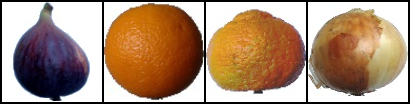

In [5]:
from torchvision.io import read_image, write_png
from torchvision.utils import make_grid
from PIL import Image

train_folder = './FOMO-Dataset/Training'
classes = ['Fig', 'Orange', 'Mandarine', 'Onion White']
images = [read_image(f'{train_folder}/{cl}/0_100.jpg') for cl in classes]
image_grid = make_grid(images, nrow=4)
write_png(image_grid, 'fomo.png')

Image.open('fomo.png')

### 10.3.2 Transforms and Augmentations

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/data_step3.png)

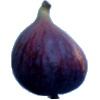

In [6]:
# funny thing is, it is both a FIG and a FIG(ure)!
fig = Image.open(f'{train_folder}/Fig/0_100.jpg')
fig

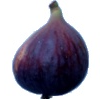

In [7]:
fig.transpose(Image.FLIP_LEFT_RIGHT)

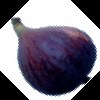

In [8]:
fig.rotate(45)

***
Torchvision offers plenty of different [transforms](https://pytorch.org/vision/main/transforms.html), divided into several groups:
- geometry: transformations such as `Resize()`, `CenterCrop()`, or `Rotation()` that modify the image's shape or its boundaries
- color: these transformations modify the image's color only, such as `Grayscale()` or `ColorJitter()`
- composition: the typical `Compose()` transformation is nothing but a way to compose several transformations in a given list together, but this group also include `RandomApply()` to apply randomly a list of transformations, for example
  - the use of `Compose()` is actually discouraged in favor of `nn.Sequential()` to allow transforms scriptability (more on that later)
- miscellaneous: this group includes the typical `Normalize()` transformation that standardizes the pixel values, and the custom `Lambda()` transformation
  - the use of `Lambda()` is also discouraged since it also not scriptable
- conversion: these transformations are used mostly to convert images back and forth to tensors, such as `ToTensor()` and `ToPILImage()`
  - these transformations come with a warning: some scale pixel values from their [0, 255] to [0, 1] range (and vice-versa), and some do not scale the value at all. Please pay special attention to these details and make sure to choose the appropriate transformation for your case
  - the typical `ToTensor()` transformation is being deprecated in favor of a combination of two other transformations, `ToImageTensor()` and `ConvertImageDtype()`, in that order
  - transformations to and from PIL images are not scriptable
- auto-augmentation: these transformations, such as `RandAugment()` and `AutoAugment()`, implement random auto-augmentation techniques
- functional: as opposed to the other groups, these transforms do not contain parameters of their own, so you're in charge of specifying them (for example, to draw a random angle to perform rotation)
***


In [9]:
from torchvision import transforms as T
from torchvision.models import get_weight

weights = get_weight('ResNet18_Weights.DEFAULT')
transforms_fn = weights.transforms()

def get_transforms(train=True):
    transfs = [T.RandAugment()] if train else []
    transfs.append(transforms_fn)
    return T.Compose(transfs)

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/data_step4.png)

In [10]:
from torchvision.datasets import ImageFolder

datasets = {}
datasets['train'] = ImageFolder(root='./FOMO-Dataset/Training', transform=get_transforms())
datasets['test'] = ImageFolder(root='./FOMO-Dataset/Test', transform=get_transforms(False))

The base class for making datasets compatible with Torchvision, `VisionDataset`, which `ImageFolder` inherits from, actually has three arguments for transformations:
- `transforms`: a callable that takes both an image and label and transforms both
- `transform`: a callable that takes an image ans transforms it
- `target_transform`: a callable that takes a label/target and transforms it


In [11]:
datasets['train'].transforms

StandardTransform
Transform: Compose(
               RandAugment(num_ops=2, magnitude=9, num_magnitude_bins=31, interpolation=InterpolationMode.NEAREST, fill=None)
               ImageClassification(
               crop_size=[224]
               resize_size=[256]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BILINEAR
           )
           )

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/data_step5.png)

In [12]:
from torch.utils.data import DataLoader

dataloaders = {}
dataloaders['train'] = DataLoader(datasets['train'], batch_size=32, shuffle=True)
dataloaders['test'] = DataLoader(datasets['test'], batch_size=32)

### 10.3.3 Model

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step1.png)

In [13]:
import torch

repo = 'pytorch/vision'
weights = get_weight('ResNet18_Weights.DEFAULT')

model = torch.hub.load(repo, 'resnet18', weights=weights)

Downloading: "https://github.com/pytorch/vision/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 213MB/s]


#### 10.3.3.1 Model Freezing

In [14]:
def freeze_model(model):
    for parameter in model.parameters():
        parameter.requires_grad = False

freeze_model(model)

In [15]:
import torch.nn as nn

# Classification Head for the FOMO dataset
torch.manual_seed(42)
model.fc = nn.Linear(512, 4)

In [16]:
for name, param in model.named_parameters():
    if param.requires_grad == True:
        print(name)

fc.weight
fc.bias


If you'd like to train different base models, such as AlexNet, VGG, or Inception, to name a few, please refer to the table below for each model's expected input image size, the layer(s) corresponding to the model's "head", and the appropriate replacement layer (considering the number of extracted features):

Model | Size | Classifier Layer(s) | Replacement Layer(s)
--- | --- | --- | ---
AlexNet | 224 | `model.classifier[6]` | `nn.Linear(4096, num_classes)`
VGG | 224 | `model.classifier[6]` | `nn.Linear(4096, num_classes)`
InceptionV3 | 299 | `model.fc` | `nn.Linear(2048, num_classes)`
 |  | `model.AuxLogits.fc` | `nn.Linear(768, num_classes)`
ResNet | 224 | `model.fc` | `nn.Linear(512, num_classes)`
DenseNet | 224 | `model.classifier` | `nn.Linear(1024, num_classes)`
SqueezeNet | 224 | `model.classifier[1]` | `nn.Conv2d(512, num_classes, kernel_size=1, stride=1)`

Source: "Deep Learning with PyTorch Step-by-Step: A Beginner's Guide - Vol II: Computer Vision" by Daniel Voigt Godoy

In [17]:
images, labels = next(iter(dataloaders['train']))

In [18]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

model.to(device)
logits = model(images.to(device))
logits

tensor([[-1.1355, -0.2022, -0.1163,  0.1853],
        [-0.4704, -0.3673,  1.2446,  0.2377],
        [-0.7080,  0.1837,  0.1494, -0.6758],
        [-1.2240, -0.3268,  0.2787, -0.4828],
        [-1.1817, -0.0728, -0.0032, -0.7081],
        [-0.8558, -0.3409,  0.4991, -1.0397],
        [-1.1391, -0.2130,  0.2410,  0.0195],
        [-1.2571, -0.4477,  0.6080, -0.1691],
        [-1.4153, -0.2740,  0.1672, -0.6846],
        [-0.4690, -0.2555,  0.4823,  0.1124],
        [-1.2957, -0.6879,  0.2374, -0.8903],
        [-0.4013, -0.3365,  0.5862,  0.2260],
        [-1.0981,  0.1739,  0.8421, -0.4000],
        [-0.7232, -0.1500,  0.3659, -0.0563],
        [-1.0256, -0.7758,  0.3387,  0.2696],
        [-0.4930, -0.0232,  0.2135, -0.6374],
        [-0.9779, -0.4253, -0.1125, -0.7417],
        [-2.0073, -0.2654,  0.5722,  0.4444],
        [-0.9135,  0.0850,  0.0961, -0.6709],
        [-0.8877, -1.1032,  0.5218, -0.1693],
        [-0.8426, -0.6283,  0.9137,  0.2830],
        [-0.5762, -0.2691,  0.8709

### 10.3.4 Training Loop

We're dealing with a multi-class classification task now, and that asks for cross-entropy loss (see table reproduced below for your convenience):

|                         | BCE Loss               | BCE With Logits Loss     | NLL Loss                    | Cross-Entropy Loss   
| --- | --- | --- | --- | --- |
|     Classification      | binary                | binary                | multiclass / binary                | multiclass / binary
| Model output (each data point) | probability           | logit                 | array of two or more log probabilities | array of two or more logits    
| Label (each data point) | float (0.0 or 1.0)    | float (0.0 or 1.0)    | long (class index)         | long (class index)
|   Model's last layer    | Sigmoid               | Linear                | LogSoftmax                 | Linear              

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step2.png)

In [19]:
loss_fn = nn.CrossEntropyLoss()

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step3.png)

In [20]:
import torch.optim as optim

# Suggested learning rate
lr = 3e-3

optimizer = optim.Adam(model.parameters(), lr=lr)

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step4.png)

In [21]:
from tqdm import tqdm

device = 'cuda' if torch.cuda.is_available() else 'cpu'

model.to(device)

batch_losses = []

## Training
for i, (batch_features, batch_targets) in tqdm(enumerate(dataloaders['train'])):
    model.train()

    batch_features = batch_features.to(device)
    batch_targets = batch_targets.to(device)

    # Step 1 - forward pass
    predictions = model(batch_features)

    # Step 2 - computing the loss
    loss = loss_fn(predictions, batch_targets)

    # Step 3 - computing the gradients
    loss.backward()
    batch_losses.append(loss.item())

    # Step 4 - updating parameters and zeroing gradients
    optimizer.step()
    optimizer.zero_grad()

66it [00:10,  6.02it/s]


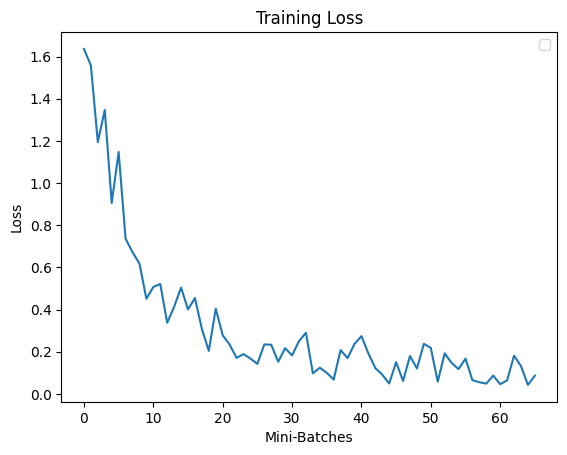

In [22]:
from matplotlib import pyplot as plt

plt.plot(batch_losses)
plt.xlabel('Mini-Batches')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

In [23]:
## Validation

with torch.inference_mode():
    val_losses = []

    for i, (val_features, val_targets) in enumerate(dataloaders['test']):
        model.eval()

        val_features = val_features.to(device)
        val_targets = val_targets.to(device)

        # Step 1 - forward pass
        predictions = model(val_features)

        # Step 2 - computing the loss
        loss = loss_fn(predictions, val_targets)
        val_losses.append(loss.item())

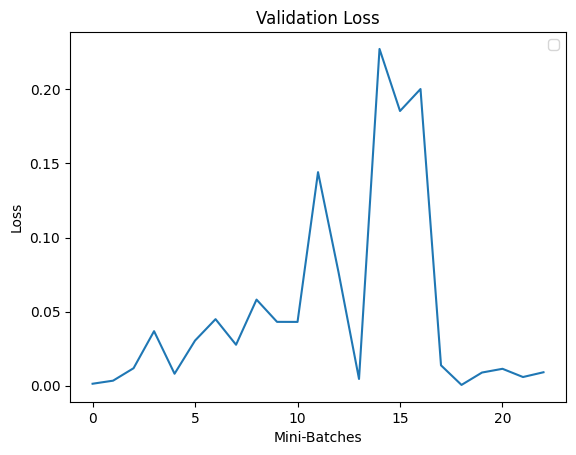

In [24]:
plt.plot(val_losses)
plt.xlabel('Mini-Batches')
plt.ylabel('Loss')
plt.title('Validation Loss')
plt.legend()

In [25]:
problematic_batches = [14, 15, 16]
high_loss_labels = []

for i, (images, targets) in enumerate(dataloaders['test']):
    if i in problematic_batches:
        high_loss_labels.append(targets)

torch.cat(high_loss_labels)

tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [26]:
datasets['test'].class_to_idx

{'Fig': 0, 'Mandarine': 1, 'Onion White': 2, 'Orange': 3}

### 10.3.5 Evaluation

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step5.png)

In [27]:
import evaluate

accuracy = evaluate.load("accuracy")

model.eval()
for features, targets in dataloaders['train']:
    pred = model(features.to(device))
    pred_class = torch.nn.functional.softmax(pred, dim=1).argmax(dim=1)
    accuracy.add_batch(references=targets, predictions=pred_class)

accuracy.compute()

{'accuracy': 0.9947842579421526}

In [28]:
datasets['train_vanilla'] = ImageFolder(root='./FOMO-Dataset/Training', transform=get_transforms(False))
dataloaders['train_vanilla'] = DataLoader(datasets['train_vanilla'], batch_size=32, shuffle=False)

accuracy = evaluate.load("accuracy")

model.eval()
for features, targets in dataloaders['train_vanilla']:
    pred = model(features.to(device))
    pred_class = torch.nn.functional.softmax(pred, dim=1).argmax(dim=1)
    accuracy.add_batch(references=targets, predictions=pred_class)

accuracy.compute()

{'accuracy': 1.0}

In [29]:
accuracy = evaluate.load("accuracy")

model.eval()
for features, targets in dataloaders['test']:
    pred = model(features.to(device))
    pred_class = torch.nn.functional.softmax(pred, dim=1).argmax(dim=1)
    accuracy.add_batch(references=targets, predictions=pred_class)

accuracy.compute()

{'accuracy': 1.0}

### 10.3.6 Inference

**UPDATE**: Unfortunately, HuggingFace's experimental API that used to power the `save_images` function isn't open anymore. To programatically retrieve images using the same function, we updated it to use a different free API: [Pixabay](https://pixabay.com/api/docs/) (although free, you still need to signup to get your own key). Your key must be available as an environment variable (`PIXABAY_KEY`).

If you prefer not to signup for an API key, you may skip the next cell and use only the provided URLs in the cells that follow it.

In [31]:
import os
os.environ['PIXABAY_KEY'] = '<INSERT YOUR PIXABAY KEY HERE>'

targets = ['fig', 'orange', 'mandarine', 'onion white', 'pineapple']

for term in targets:
    save_images('./images', term, count=5)

Retrieved 5 images for fig
Retrieved 5 images for orange
Retrieved 5 images for mandarine
Retrieved 5 images for onion white
Retrieved 5 images for pineapple


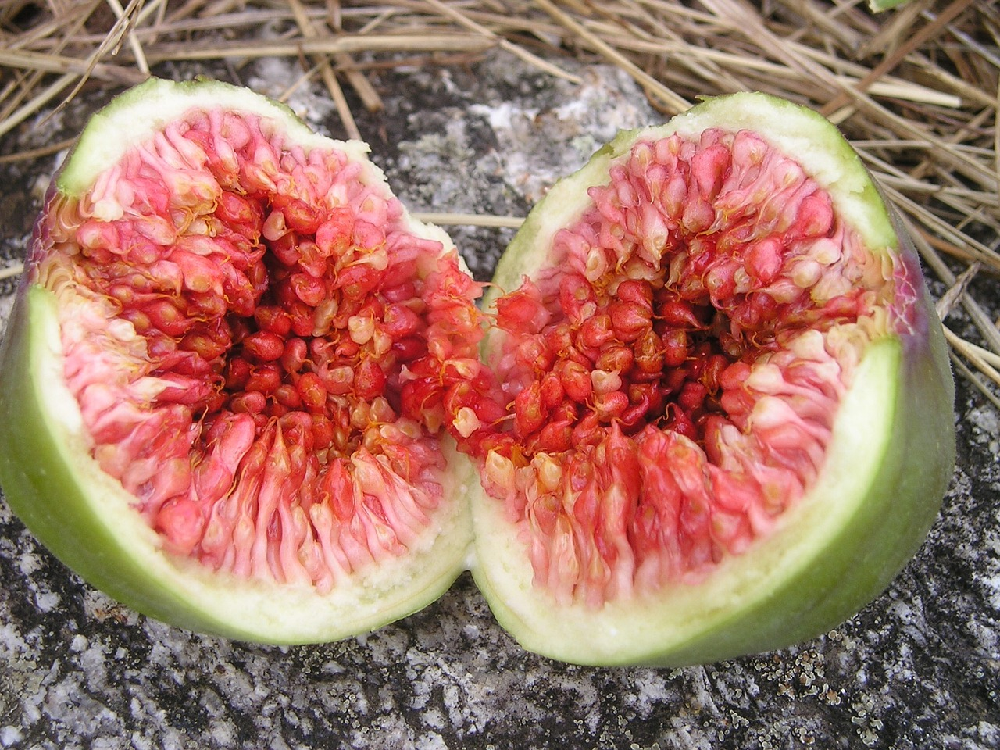

In [32]:
fig_url = 'https://cdn.pixabay.com/photo/2012/09/08/17/38/euro-dynasty-56405_1280.jpg'
get_image_from_url(fig_url)

In [33]:
def predict(path_or_url, model, transforms_fn, categories, topk=1, headers=None):
    if path_or_url.startswith('http'):
        img = get_image_from_url(path_or_url, headers=headers)
    else:
        img = Image.open(path_or_url)

    # Preprocesses the image using the transforms_fn
    preproc_img = transforms_fn(img)
    # If there are only three dimensions (CHW), unsqueeze the first
    # to get a mini-batch of one (NCHW)
    if len(preproc_img.shape) == 3:
        preproc_img = preproc_img.unsqueeze(0)

    # Never forget to set the model to evaluation mode!
    model.eval()
    # We find in which device the model is loaded on
    # and send the preprocessed image to the same device
    # to get predictions from the model
    device = next(iter(model.parameters())).device
    pred = model(preproc_img.to(device))

    # If the output is a dictionary, extract logits from it
    if isinstance(pred, dict):
        pred = pred['logits']

    # Binary classification
    is_binary = (pred.shape[1] == 1)
    if is_binary:
        # Uses sigmoid function to convert predicted logits into probabilities
        probability = torch.sigmoid(pred).squeeze()
        # In binary classification, we need to use a threshold to determine if
        # it is a positive or a negative class
        threshold = 0.5
        pred_class = probability > threshold
        values = (1-probability) if (probability <= threshold) else probability
        return [{'label': categories[pred_class], 'value': values.tolist()}]
    # Multi-class classification
    else:
        # Uses softmax function to convert predicted logits into probabilities
        probabilities = torch.nn.functional.softmax(pred[0], dim=0)
        # In multi-class classification, we may take the top-k results only
        values, indices = torch.topk(probabilities, topk)
        return [{'label': categories[i], 'value': v.item()} for i, v in zip(indices, values)]

In [34]:
predict(fig_url, model, transforms_fn, datasets['train'].classes, 4)

[{'label': 'Fig', 'value': 0.7930050492286682},
 {'label': 'Mandarine', 'value': 0.17896369099617004},
 {'label': 'Onion White', 'value': 0.02123061940073967},
 {'label': 'Orange', 'value': 0.006800665054470301}]

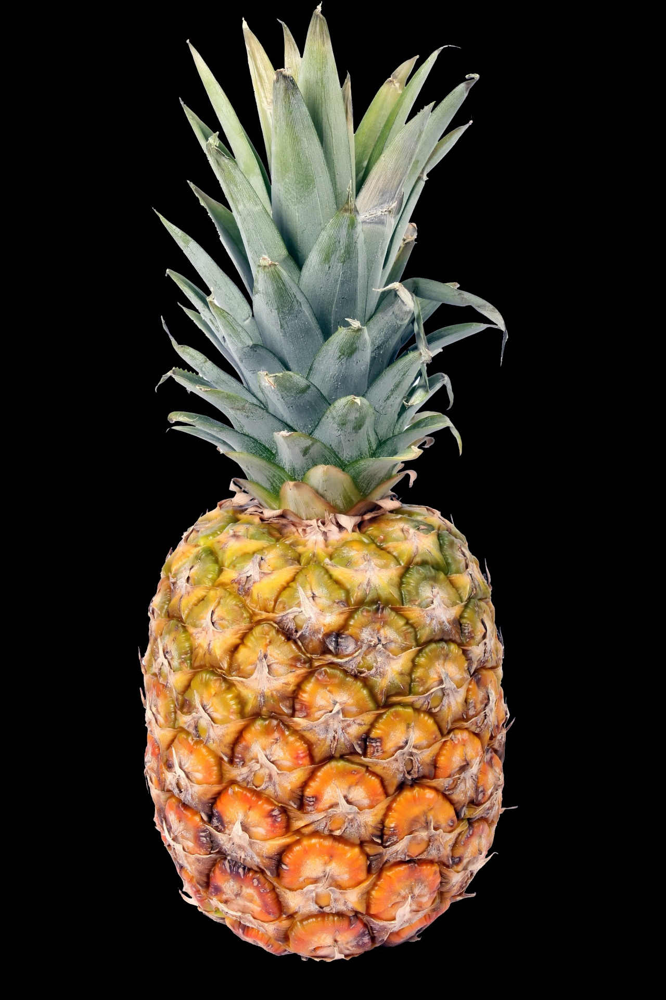

In [35]:
pineapple_url = 'https://storage.needpix.com/rsynced_images/pineapple-1477419208LRZ.jpg'
get_image_from_url(pineapple_url)

In [36]:
predictions = predict(pineapple_url, model, transforms_fn, datasets['train'].classes, 4)
predictions

[{'label': 'Onion White', 'value': 0.4970453083515167},
 {'label': 'Mandarine', 'value': 0.25726550817489624},
 {'label': 'Orange', 'value': 0.1982702612876892},
 {'label': 'Fig', 'value': 0.04741885885596275}]

In [37]:
def most_likely(predictions):
    category, prob = predictions[0]['label'], predictions[0]['value']
    if prob >= .5:  # choose your threshold here
        return category
    else:
        return 'Uncertain'

In [38]:
most_likely(predictions)

'Uncertain'

In [39]:
url = 'https://upload.wikimedia.org/wikipedia/commons/7/72/Igel.JPG'
headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/102.0.0.0 Safari/537.36'}
predictions = predict(url, model, transforms_fn, datasets['train'].classes, 4, headers=headers)
predictions

[{'label': 'Onion White', 'value': 0.6845194101333618},
 {'label': 'Fig', 'value': 0.20679043233394623},
 {'label': 'Mandarine', 'value': 0.059586070477962494},
 {'label': 'Orange', 'value': 0.049104128032922745}]

In [40]:
most_likely(predictions)

'Onion White'

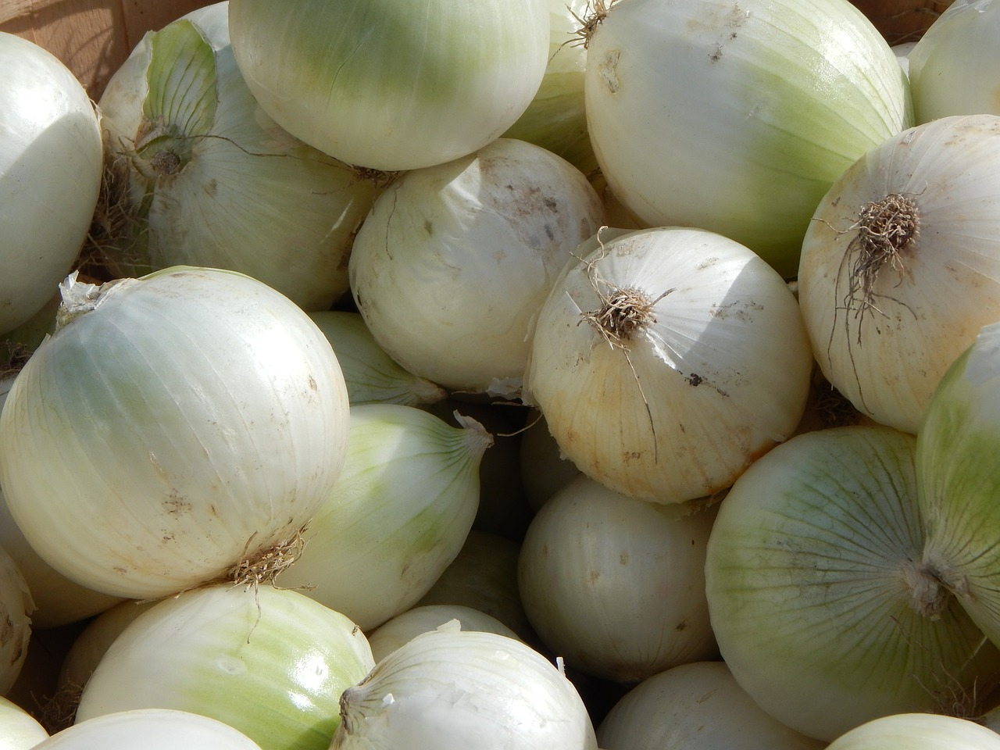

In [41]:
onion_url = 'https://www.haleo.co.uk/wp-content/uploads/2014/10/onions.jpg'
get_image_from_url(onion_url)

In [42]:
predictions = predict(onion_url, model, transforms_fn, datasets['train'].classes, 4)
predictions

[{'label': 'Onion White', 'value': 0.5000603199005127},
 {'label': 'Orange', 'value': 0.44204893708229065},
 {'label': 'Fig', 'value': 0.04643510654568672},
 {'label': 'Mandarine', 'value': 0.01145563181489706}]

In [43]:
most_likely(predictions)

'Onion White'

In [45]:
ensemble = [predictions] + [predict(onion_url, model, get_transforms(), datasets['train'].classes, 4) for _ in range(6)]
ensemble

[[{'label': 'Onion White', 'value': 0.5000603199005127},
  {'label': 'Orange', 'value': 0.44204893708229065},
  {'label': 'Fig', 'value': 0.04643510654568672},
  {'label': 'Mandarine', 'value': 0.01145563181489706}],
 [{'label': 'Onion White', 'value': 0.531319260597229},
  {'label': 'Orange', 'value': 0.41709068417549133},
  {'label': 'Fig', 'value': 0.03984806314110756},
  {'label': 'Mandarine', 'value': 0.011741986498236656}],
 [{'label': 'Orange', 'value': 0.4779048264026642},
  {'label': 'Onion White', 'value': 0.45384830236434937},
  {'label': 'Fig', 'value': 0.05601497367024422},
  {'label': 'Mandarine', 'value': 0.012231878004968166}],
 [{'label': 'Orange', 'value': 0.4900091588497162},
  {'label': 'Onion White', 'value': 0.47705841064453125},
  {'label': 'Fig', 'value': 0.02810296230018139},
  {'label': 'Mandarine', 'value': 0.0048295240849256516}],
 [{'label': 'Onion White', 'value': 0.7307136058807373},
  {'label': 'Orange', 'value': 0.20167751610279083},
  {'label': 'Fig', 

In [46]:
[p[0] for p in ensemble]

[{'label': 'Onion White', 'value': 0.5000603199005127},
 {'label': 'Onion White', 'value': 0.531319260597229},
 {'label': 'Orange', 'value': 0.4779048264026642},
 {'label': 'Orange', 'value': 0.4900091588497162},
 {'label': 'Onion White', 'value': 0.7307136058807373},
 {'label': 'Onion White', 'value': 0.7167226672172546},
 {'label': 'Onion White', 'value': 0.5456726551055908}]

In [47]:
torch.save(model.state_dict(), 'fomo_model.pth')

## 10.4 Zero-Shot Image Classification

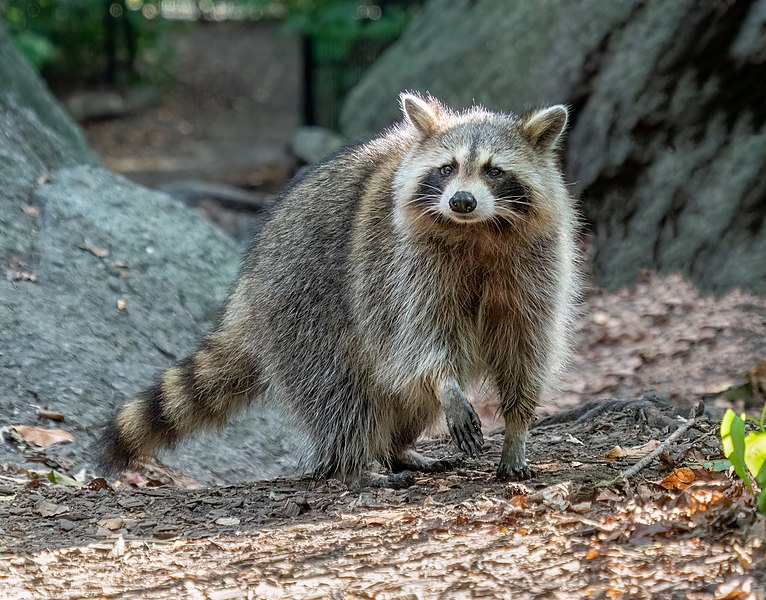

In [48]:
url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/3/3e/Raccoon_in_Central_Park_%2835264%29.jpg/1280px-Raccoon_in_Central_Park_%2835264%29.jpg'
headers = {'User-Agent': 'CoolBot/0.0 (https://example.org/coolbot/; coolbot@example.org)'}
img1 = get_image_from_url(url, headers)
img1

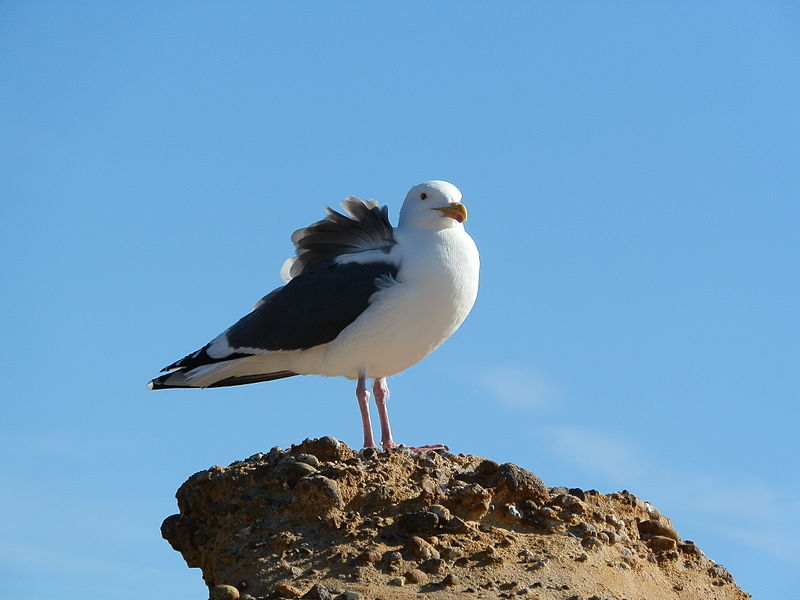

In [49]:
url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/0b/Sea_Gull_at_Point_Lobos_State_Natural_Reserve%2C_CA.jpg/1280px-Sea_Gull_at_Point_Lobos_State_Natural_Reserve%2C_CA.jpg'
headers = {'User-Agent': 'CoolBot/0.0 (https://example.org/coolbot/; coolbot@example.org)'}
img2 = get_image_from_url(url, headers)
img2

In [50]:
from transformers import pipeline

device = 0 if torch.cuda.is_available() else -1

classifier = pipeline('image-classification', model='google/vit-base-patch16-224', device=device)
classifier([img1, img2])

[[{'score': 0.13335655629634857,
   'label': 'fox squirrel, eastern fox squirrel, Sciurus niger'},
  {'score': 0.07666327059268951,
   'label': 'grey fox, gray fox, Urocyon cinereoargenteus'},
  {'score': 0.06758510321378708, 'label': 'mink'},
  {'score': 0.055284906178712845,
   'label': 'polecat, fitch, foulmart, foumart, Mustela putorius'},
  {'score': 0.0316028892993927, 'label': 'wombat'}],
 [{'score': 0.6800497174263, 'label': 'albatross, mollymawk'},
  {'score': 0.04493739455938339, 'label': 'oystercatcher, oyster catcher'},
  {'score': 0.03910054266452789,
   'label': 'ruddy turnstone, Arenaria interpres'},
  {'score': 0.007704189978539944, 'label': 'magpie'},
  {'score': 0.00718264002352953, 'label': 'redshank, Tringa totanus'}]]

In [ ]:
zero_shot_clf = pipeline(task="zero-shot-image-classification", model="openai/clip-vit-large-patch14", device=device)

In [52]:
zero_shot_clf([img1, img2], candidate_labels=['raccoon', 'seagull', 'albatross', 'fox squirrel'])

[[{'score': 0.9999823570251465, 'label': 'raccoon'},
  {'score': 1.7488973753643222e-05, 'label': 'fox squirrel'},
  {'score': 1.1079360007215655e-07, 'label': 'seagull'},
  {'score': 2.124838260897377e-08, 'label': 'albatross'}],
 [{'score': 0.989651083946228, 'label': 'seagull'},
  {'score': 0.010347060859203339, 'label': 'albatross'},
  {'score': 1.8597038433654234e-06, 'label': 'raccoon'},
  {'score': 1.2907973356846014e-08, 'label': 'fox squirrel'}]]

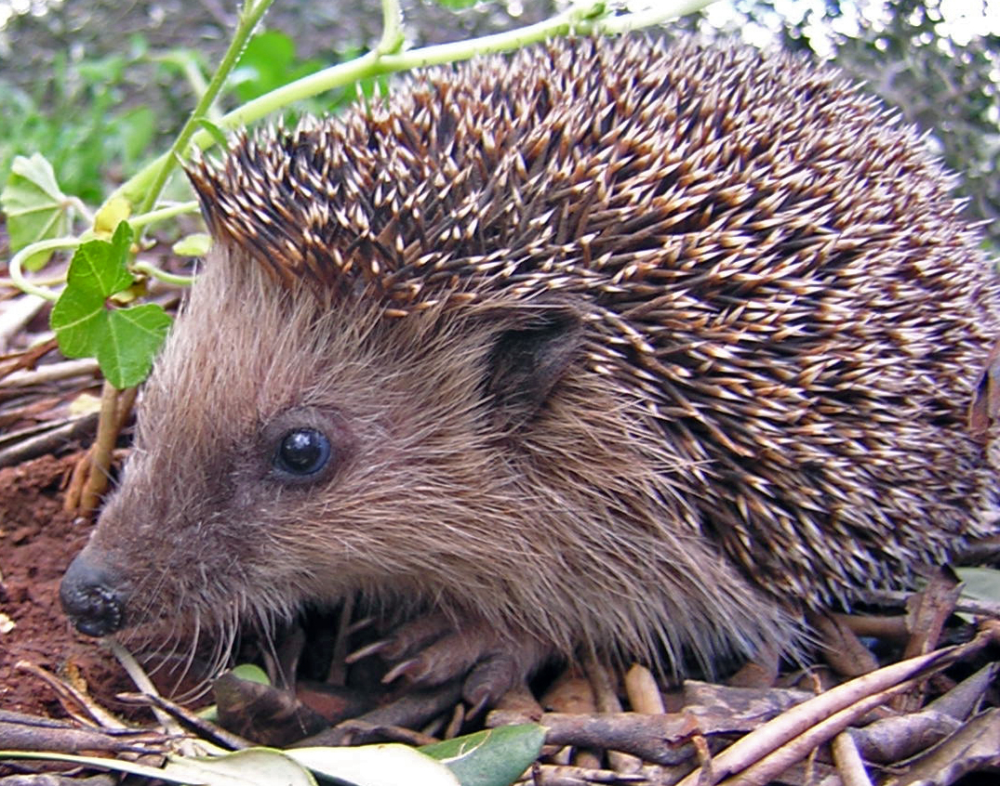

In [53]:
url = 'https://upload.wikimedia.org/wikipedia/commons/7/72/Igel.JPG'
headers = {'User-Agent': 'CoolBot/0.0 (https://example.org/coolbot/; coolbot@example.org)'}
img3 = get_image_from_url(url, headers)
img3

In [54]:
zero_shot_clf(img3, candidate_labels=['raccoon', 'seagull', 'albatross', 'fox squirrel'])

[{'score': 0.9541819095611572, 'label': 'raccoon'},
 {'score': 0.04067723825573921, 'label': 'seagull'},
 {'score': 0.0050084530375897884, 'label': 'fox squirrel'},
 {'score': 0.00013246465823613107, 'label': 'albatross'}]